# Problem 1

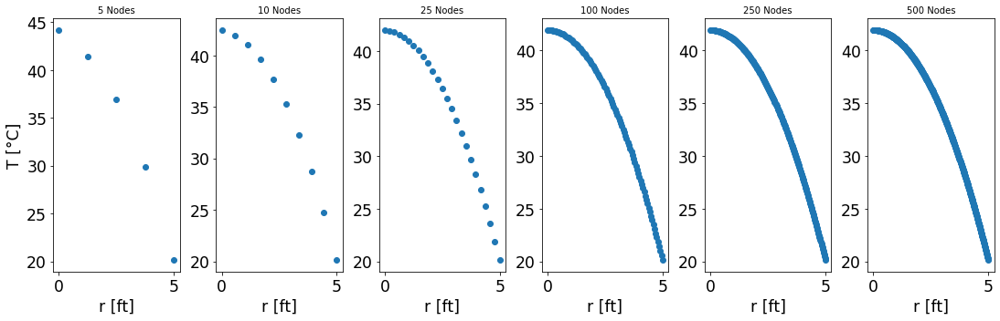

In [16]:
#@title
# Set up the python script
# import required modules

#Numerical Math
import math # math functions
import numpy as np # numerical math
from numpy import *
import time

# Scientific Math
import scipy # scientific computing functions
import scipy.special as sp # scientific computing functions

#Symbolic math
import sympy # symbolic math
from sympy import *
from sympy.abc import x

#Import contsants. 
from scipy.constants import pi 

# Widgets
import ipywidgets as widgets
from IPython.display import display
from ipywidgets import interact

#plotting
params = {'legend.fontsize': 'xx-large',
          'figure.figsize': (15, 10),
         'axes.labelsize': 'xx-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'xx-large',
         'ytick.labelsize':'xx-large'}
import matplotlib.pyplot as plt
plt.rcParams.update(params)

# 1. Set Up

Tinf = 20  #(K) Air temperature
h = 10    #(W/m^2-K) convection coefficient
R_bale = 5*0.3048       #(m) length of plane wall
q_dot = 1.5  #(W/m^5) Coefficient in heat generation rate equation: q_dot = q0*(L^2-x^2)
k =0.04     #(W/m-K) thermal conductivity
k_p=0.15
tp=0.045*0.0254
R1=ln((R_bale+tp)/R_bale)/(2*math.pi*k_p)
R2=1/(2*math.pi*(R_bale+tp)*h)
R_eq=R1+R2
N = 500

q = q_dot;


def tbale(N):
    A=np.zeros((N,N))
    b = np.zeros(N)
    dr = R_bale/(N-1)
    ri=dr
    # 2. Interior Nodes (1...N-2 as python counts from 0)
    for j in range(1,N-1):
        rii=ri-(dr/2)
        rio=ri+(dr/2)
        A[j,j] = (rii+rio)/dr**2
        A[j,j-1] = -rii/dr**2
        A[j,j+1] = -rio/dr**2
        b[j] = q_dot*ri/k
        ri=ri+dr
        

    #r=0
    A[0,0] = 1
    A[0,1]=-1
    b[0] = (q_dot*dr**2)/(2*k)

    #r=R_bale
    R_balei=R_bale-(dr/2)
    A[N-1,N-2] = 2*math.pi*R_balei*k/dr
    A[N-1,N-1] = (-k*2*math.pi*R_balei/dr)+(-1/R_eq)
    b[N-1] = -Tinf/R_eq-q_dot*math.pi*R_bale*dr
    

    # 4. Solve
    t0=time.time()
    T=np.linalg.solve(A,b)
    t1=time.time()
    time_elapsed=t1-t0
    return T, time_elapsed
Ns=np.array([5,10,25,100,250,500])
Tmax=np.zeros(len(Ns))
time_elapsed=np.zeros(len(Ns))
fig, ax=plt.subplots(1,6,figsize=(15,5))
m2=3.28084
for i in range(len(Ns)):
    Tb,time_elapsed[i]=tbale(Ns[i])
    Tmax[i]=np.max(Tb)
    r=np.linspace(0,R_bale, Ns[i])
    ax[i].plot(r*m2,Tb, 'o')
    ax[i].set_xlabel('r [ft]')
    ax[i].set_title(f'{Ns[i]:1.0f} Nodes', size=10)
fig.tight_layout()
ax[0].set_ylabel('T [°C]')
plt.show()

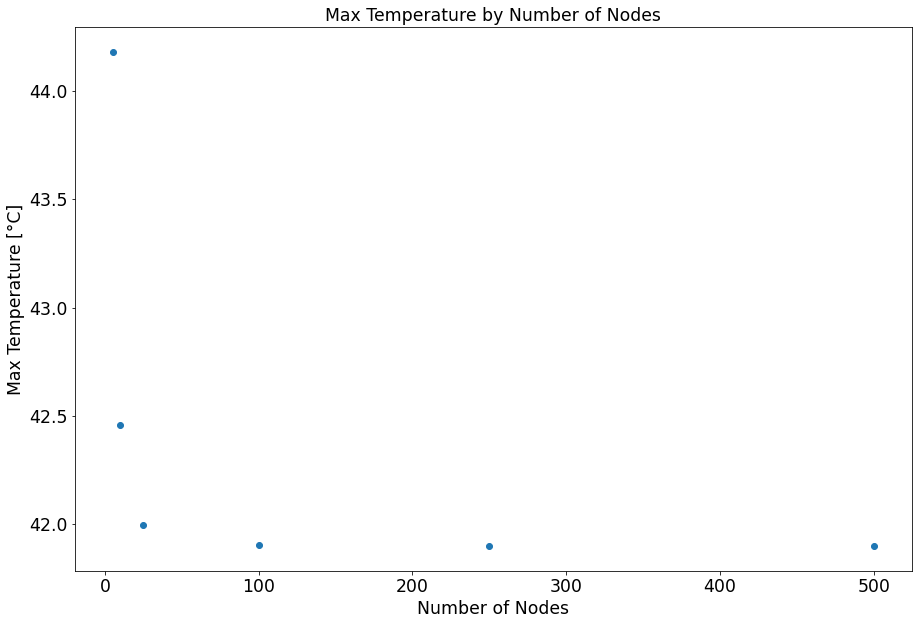

N:	 5 		 25 		 100 		 250 		 500
Tmax: 	 44.18201 	 42.45714 	 41.99436 	 41.90436 	 41.89839 	 41.89743


In [18]:
fig,ax=plt.subplots()
ax.plot(Ns, Tmax, 'o')
ax.set_title('Max Temperature by Number of Nodes')
ax.set_xlabel('Number of Nodes')
ax.set_ylabel('Max Temperature [°C]')
plt.show()
print('N:\t 5 \t\t 25 \t\t 100 \t\t 250 \t\t 500')
print(f'Tmax: \t {Tmax[0]:1.5f} \t {Tmax[1]:1.5f} \t {Tmax[2]:1.5f} \t {Tmax[3]:1.5f} \t {Tmax[4]:1.5f} \t {Tmax[5]:1.5f}')


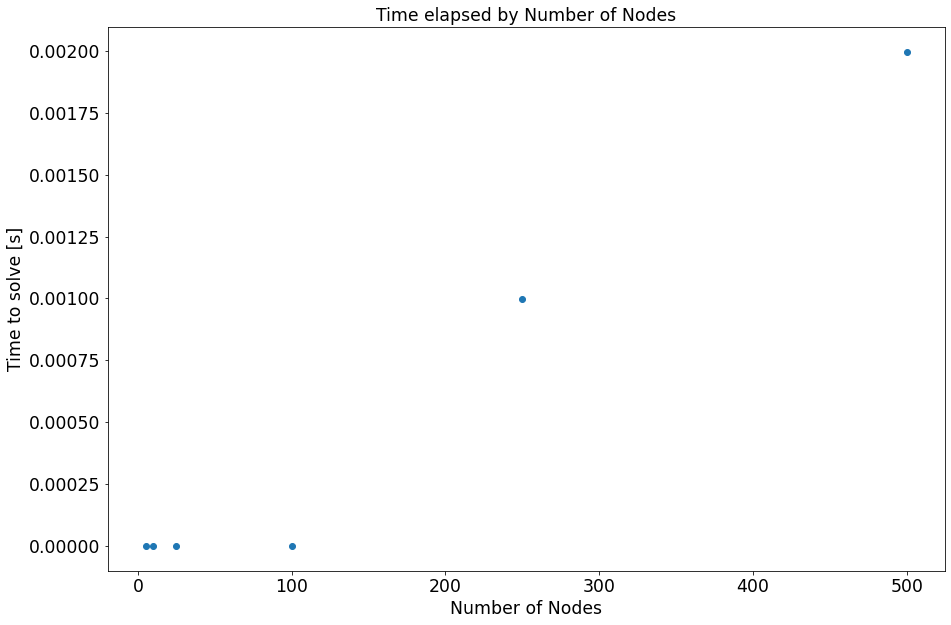

N:	 5 		 25 		 100 		 250 		 500
Tmax: 	 0.00000 	 0.00000 	 0.00000 	 0.00000 	 0.00100 	 0.00200


In [19]:
fig,ax=plt.subplots()
ax.plot(Ns, time_elapsed, 'o')
ax.set_title('Time elapsed by Number of Nodes')
ax.set_xlabel('Number of Nodes')
ax.set_ylabel('Time to solve [s]')
plt.show()
print('N:\t 5 \t\t 25 \t\t 100 \t\t 250 \t\t 500')
print(f'Tmax: \t {time_elapsed[0]:1.5f} \t {time_elapsed[1]:1.5f} \t {time_elapsed[2]:1.5f} \t {time_elapsed[3]:1.5f} \t {time_elapsed[4]:1.5f} \t {time_elapsed[5]:1.5f}')


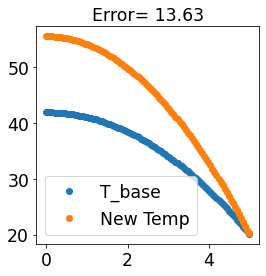

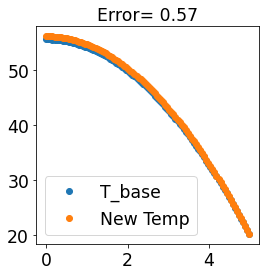

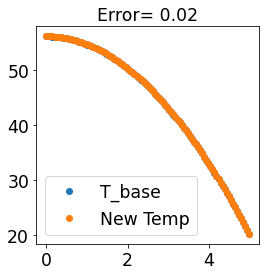

Converged within 0.023 K after 3 iterations


In [21]:
def TbaleQdot(N, q_dot):
    A=np.zeros((N,N))
    b=np.zeros(N)
    dr=R_bale/(N-1)
    ri=dr
    for j in range(1,N-1):
        rii=ri-(dr/2)
        rio=ri+(dr/2)
        A[j,j] = (rii+rio)/dr**2
        A[j,j-1] = -rii/dr**2
        A[j,j+1] = -rio/dr**2
        b[j] = q_dot[j]*ri/k
        ri=ri+dr
        

    #r=0
    A[0,0] = 1
    A[0,1]=-1
    b[0] = (q_dot[0]*dr**2)/(2*k)

    #r=R_bale
    R_balei=R_bale-(dr/2)
    A[N-1,N-2] = 2*math.pi*R_balei*k/dr
    A[N-1,N-1] = (-k*2*math.pi*R_balei/dr)+(-1/R_eq)
    b[N-1] = -Tinf/R_eq-q_dot[N-1]*math.pi*R_bale*dr

    # 4. Solve
    t0=time.time()
    T=np.linalg.solve(A,b)
    Temp=T+273.15
    t1=time.time()
    time_elapsed=t1-t0
    return Temp
def qdotT(T):
    qdotTemp=1.5*np.exp((T)/320)**0.5
    return qdotTemp
N=100
r=np.linspace(0, R_bale, N)
Tb=tbale(N)[0]
Tbase=Tb+273.15
Tmax_estimate=np.array([np.max(Tbase)])
w=0
esp=0.1
err=100
while err>esp:
    w=w+1
    if w>1:
        Tbase=Tnew
    Tnew=TbaleQdot(N, qdotT(Tbase))
    Tmax_estimate=np.append(Tmax_estimate, np.max(Tnew))
    err=np.abs(Tmax_estimate[w]-Tmax_estimate[w-1])
    plt.figure(figsize=(4,4))
    plt.plot(r*m2, Tbase-273.15, 'o', label='T_base')
    plt.plot(r*m2, Tnew-273.15, 'o', label='New Temp')
    plt.title(f'Error= {err:1.2f}')
    plt.legend()
    plt.show()
print(f'Converged within {err:1.3f} K after {w:d} iterations')


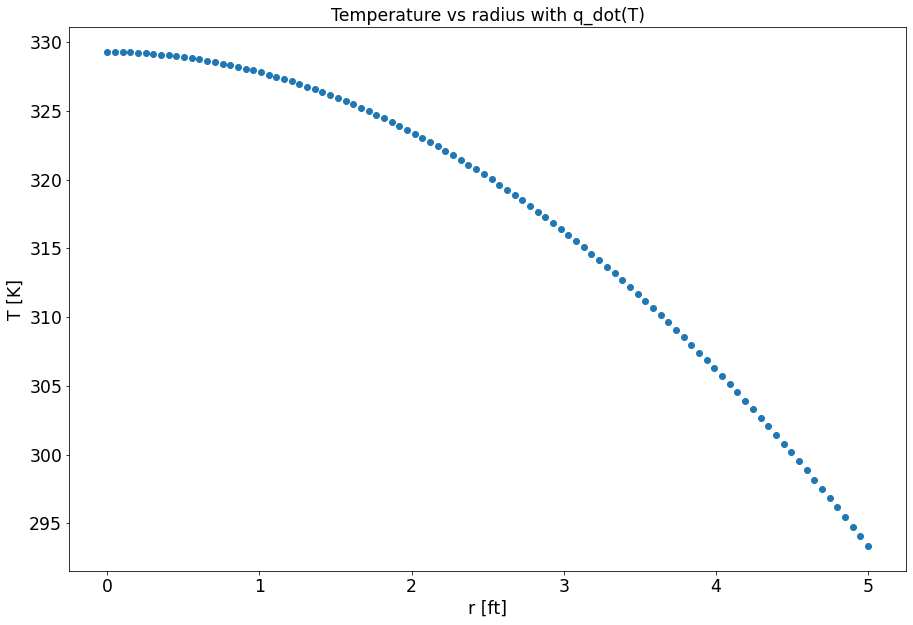

In [22]:
plt.figure()
plt.title('Temperature vs radius with q_dot(T)')
plt.plot(r*m2, Tnew, 'o')
plt.xlabel('r [ft]')
plt.ylabel('T [K]')
plt.show()

# Problem 2

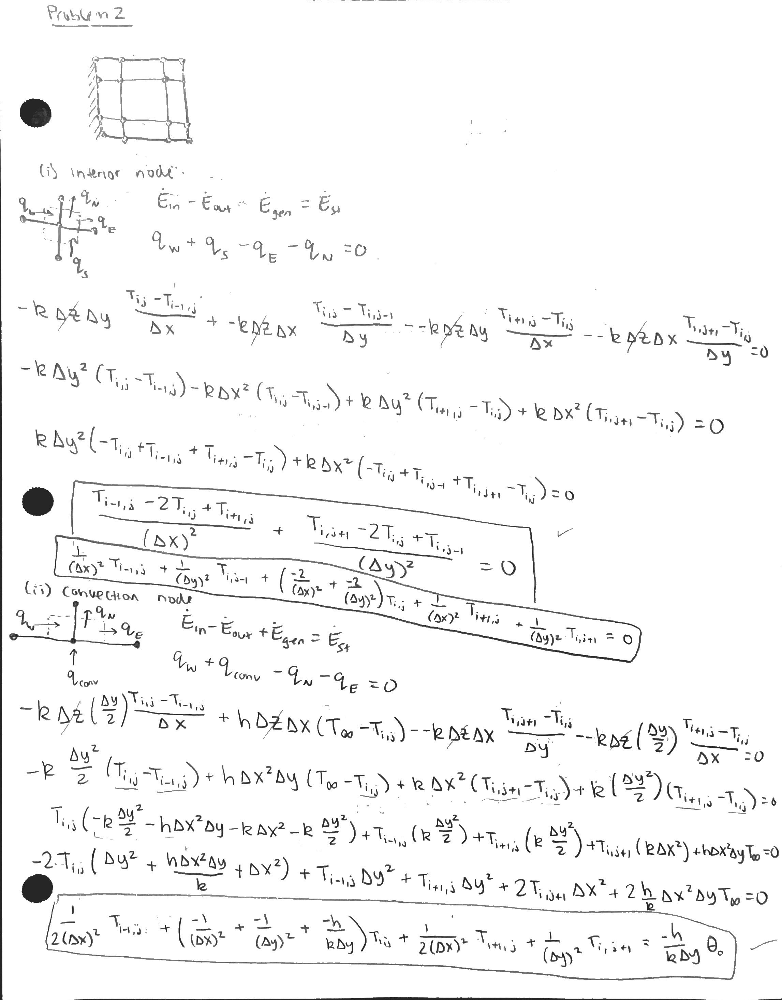

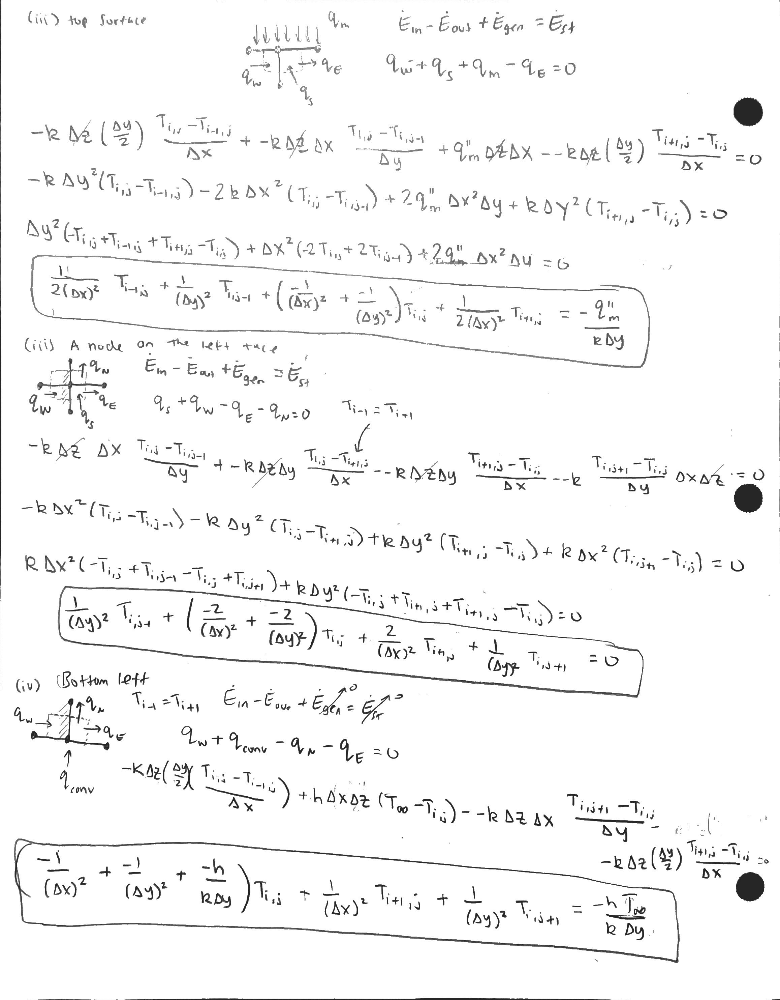

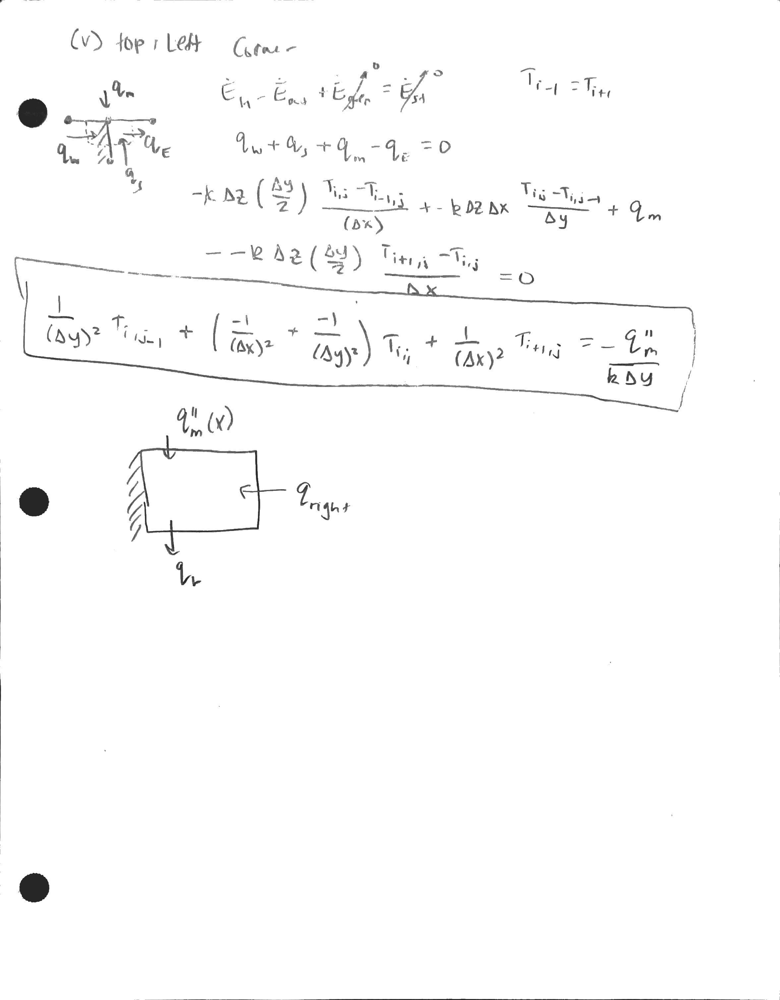

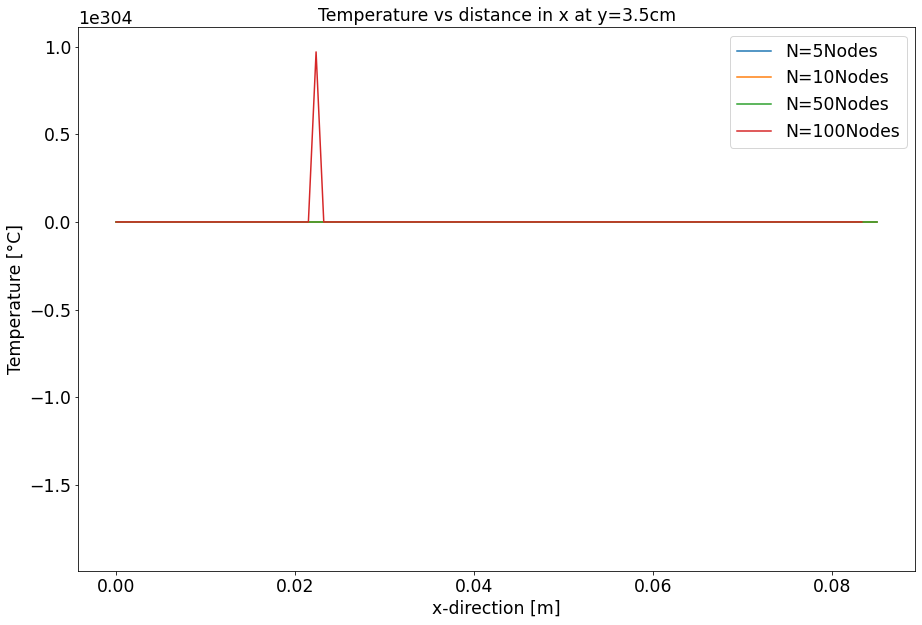

In [17]:
import math
# 1. Set Up
N = 50

b = 3.5*10**-2 # [m] Length
Lj=2*10**(-2)
w = 8.5*10**-2 # [m] Width
k = 38 # [W/m K] thermal conductivity
h=5000
Tf=-35+273.15
Ts=25+273.15
qj=10**6
Lj=2*10**-2
N = [5,10,50,100]
eps=0
M = N
x = [None, None, None, None]
y = [None, None, None, None]
T = [None, None, None, None]
for t in range(4):   # python stops at upper value -1
    n=N[t]
    m=N[t]
    dx=w/(n-1)
    dy=b/(n-1)
    x[t]=np.linspace(0,w,num=n)
    y[t]=np.linspace(0,b,num=n)
    A=np.zeros((n*m, n*m))
    c=np.zeros(n*m)
    d=np.zeros(n*m)
    #Interior Nodes
    for i1 in range(1,n-1):
        for j1 in range(1, m-1):
            ind=i1+j1*n
            A[ind, ind]=-2/dx**2-2/dy**2
            A[ind, ind-1]=1/dx**2
            A[ind, ind+1]=1/dx**2
            A[ind, ind-n]=1/dy**2
            A[ind, ind+n]=1/dy**2
            d[ind]=esp
            c[ind]=ind
    #Bottom Surface        
    for i2 in range(1,n-1):
        j2=0
        ind=j2*n+i2
        A[ind, ind]=-h/dy-k/dx**2-k/dy**2
        A[ind, ind-1]=k/(2*dx**2)
        A[ind, ind+1]=k/(2*dx**2)
        A[ind, ind+n]=k/dy**2
        d[ind]=-h/dy*Tf
        c[ind]=ind
    #Top Surface    
    for i3 in range(1,n-1):
        j3=m-1
        ind=j3*n+i3
        A[ind, ind]=-k/dx**2-k/dy**2
        A[ind, ind-1]=k/(2*dx**2)
        A[ind, ind+1]=k/(2*dx**2)
        A[ind, ind-n]=k/dy**2
        if i3*dx<Lj:
            d[ind]=-(qj*exp(-i3*dx/Lj))/dy
        else:
            d[ind]=esp
        c[ind]=ind
    #Right Side
    for j4 in range(m):
        i4=n-1
        ind=j4*n+i4
        A[ind, ind]=1
        d[ind]=Ts
        c[ind]=ind
    i7=0
    for j7 in range(1,m-1):
        ind=j7*n+i7
        A[ind, ind]=-k/dx**2-k/dy**2
        A[ind, ind-n]=k/(2*dy**2)
        A[ind, ind+n]=k/(2*dy**2)
        A[ind, ind+1]=k/dx**2
        d[ind]=esp
        c[ind]=ind
    i5=0
    j5=0
    ind=j5*n+i5
    A[ind, ind]=-h/(2*dy)-k/(2*dx**2)-k/(2*dy**2)
    A[ind, ind+n]=k/(2*dy**2)
    A[ind, ind+1]=k/(2*dx**2)
    d[ind]=-h/(2*dy)*Tf
    c[ind]=ind
    
    i6=0
    j6=m-1
    ind=i6+j6*n
    A[ind, ind]=-k/(2*dx**2)-k/(2*dy**2)
    A[ind, ind-n]=k/(2*dy**2)
    A[ind, ind+1]=k/(2*dx**2)
    d[ind]=-qj/(2*dy)
    c[ind]=ind
    
    Temp=np.linalg.solve(A,d)
    TT=np.reshape(Temp, (m,n))
    T[t]=Temp[n*(m-1):n*m]
    
for i in range(4):
    label=str("N=" +str(N[i])+'Nodes')
    plt.plot(x[i],T[i]-273.15, label=label)
    plt.xlabel('x-direction [m]')
    plt.ylabel('Temperature [°C]')
    plt.title('Temperature vs distance in x at y=3.5cm')
plt.legend()
plt.show()
    
            


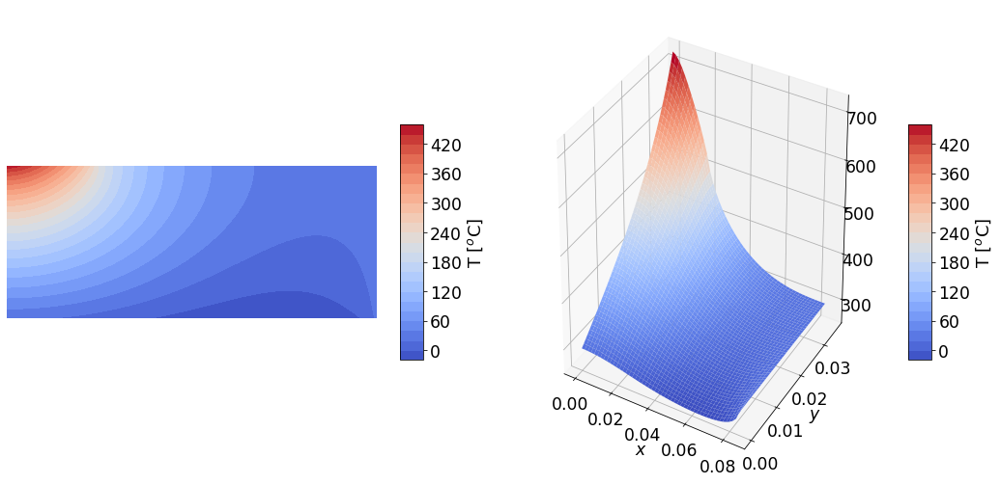

In [14]:
import math # math functions
import numpy as np # numerical math
from numpy import *
import time

# Scientific Math
import scipy # scientific computing functions
import scipy.special as sp # scientific computing functions

#Symbolic math
import sympy # symbolic math
from sympy import *
from sympy.abc import x

#Import contsants. 
from scipy.constants import pi 

# Widgets
import ipywidgets as widgets
from IPython.display import display
from ipywidgets import interact

#plotting
params = {'legend.fontsize': 'xx-large',
          'figure.figsize': (15, 10),
         'axes.labelsize': 'xx-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'xx-large',
         'ytick.labelsize':'xx-large'}
import matplotlib.pyplot as plt
plt.rcParams.update(params)
N = 50
eps=0

b = 3.5*10**-2      # [m] Length 
w = 8.5*10**-2    # [m] Width
k = 38      # [W/m K] thermal conductivity
h=1000
N = 50
esp=0
M = N
x = [None, None, None, None]
y = [None, None, None, None]
T = [None, None, None, None]
h = 5000   
Tf = -35+273.15
Ts=25+273.15
qj=10**6
Lj=2*10**-2
n=N
m=N
dx=w/(n-1)
dy=b/(n-1)
x=np.linspace(0,w,num=n)
y=np.linspace(0,b,num=n)
A=np.zeros((n*m, n*m))
c=np.zeros(n*m)
d=np.zeros(n*m)

for i1 in range(1,n-1):
    for j1 in range(1, m-1):
        ind=i1+j1*n
        A[ind, ind]=-2/dx**2-2/dy**2
        A[ind, ind-1]=1/dx**2
        A[ind, ind+1]=1/dx**2
        A[ind, ind-n]=1/dy**2
        A[ind, ind+n]=1/dy**2
        d[ind]=esp
        c[ind]=ind
for i2 in range(1,n-1):
    j2=0
    ind=j2*n+i2
    A[ind, ind]=-h/dy-k/dx**2-k/dy**2
    A[ind, ind-1]=k/(2*dx**2)
    A[ind, ind+1]=k/(2*dx**2)
    A[ind, ind+n]=k/dy**2
    d[ind]=-h/dy*Tf
    c[ind]=ind
for i3 in range(1,n-1):
    j3=m-1
    ind=j3*n+i3
    A[ind, ind]=-k/dx**2-k/dy**2
    A[ind, ind-1]=k/(2*dx**2)
    A[ind, ind+1]=k/(2*dx**2)
    A[ind, ind-n]=k/dy**2
    if i3*dx<Lj:
        d[ind]=-(qj*math.exp(-i3*dx/Lj))/dy
    else:
        d[ind]=esp
    c[ind]=ind
for j4 in range(m):
    i4=n-1
    ind=j4*n+i4
    A[ind, ind]=1
    d[ind]=Ts
    c[ind]=ind
i7=0
for j7 in range(1,m-1):
    ind=j7*n+i7
    A[ind, ind]=-k/dx**2-k/dy**2
    A[ind, ind-n]=k/(2*dy**2)
    A[ind, ind+n]=k/(2*dy**2)
    A[ind, ind+1]=k/dx**2
    d[ind]=esp
    c[ind]=ind
i5=0
j5=0
ind=j5*n+i5
A[ind, ind]=-h/(2*dy)-k/(2*dx**2)-k/(2*dy**2)
A[ind, ind+n]=k/(2*dy**2)
A[ind, ind+1]=k/(2*dx**2)
d[ind]=-h/(2*dy)*Tf
c[ind]=ind

i6=0
j6=m-1
ind=i6+j6*n
A[ind, ind]=-k/(2*dx**2)-k/(2*dy**2)
A[ind, ind-n]=k/(2*dy**2)
A[ind, ind+1]=k/(2*dx**2)
d[ind]=-qj/(2*dy)
c[ind]=ind

Temp=np.linalg.solve(A,d)
TT=np.reshape(Temp, (m,n))
T[t]=Temp[n*(m-1):n*m]

# 5. Plot
xx,yy = meshgrid(x,y)
fig = plt.figure(figsize=plt.figaspect(0.5))
ax = fig.add_subplot(1, 2, 1)
fig.subplots_adjust(wspace=0.1)
fig.set_figheight(9)
fig.set_figwidth(18)

ct = ax.contourf(xx,yy,TT-273.15,25,cmap='coolwarm')
ax.axis('equal');  
cbar = fig.colorbar(ct, shrink=0.5, aspect=10)
cbar.set_label('T [$^o$C]', fontsize = 18)
ax.axis('off')

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.plot_surface(xx, yy, TT, cmap='coolwarm') 
ax.set(xlabel='$x$', ylabel='$y$')
cbar =  fig.colorbar(ct, shrink=0.5, aspect=10)
cbar.set_label('T [$^o$C]', fontsize = 18)


In [25]:
for i in range(0,n):
    qtop=+(-k*(Temp[n*(m-1)-1-i]-Temp[n*m-1-i])/dy)
print('q_top', qtop*w)

q_top 81287.04578896609


In [26]:
for j in range(0,m):
    qright=+(-k*(Temp[(n-1)+n*j-1]-Temp[(n-1)+n*j])/dx)
print('q_right', qright*b)

for i in range(0,n):
    qbottom=+h*(Tf-Temp[i])
print('qbottom', qbottom*w)

for j in range(0,m):
    qleft=+(-k*(Temp[n*j]-Temp[n*j+1])/dx)
print('qleft', qleft*b)

for i in range(0,n):
    qtop=+(-k*(Temp[n*(m-1)-1-i]-Temp[n*m-1-i])/dy)
print('qtop', qtop*w)
qnet=qtop*w+qleft*b+qright*b+qbottom*w
print('qnet', qnet)

q_right -19.08332046357391
qbottom -25500.00002468088
qleft -3712.9542110337966
qtop 81287.04578896609
qnet 52055.00823278785


# Problem 3

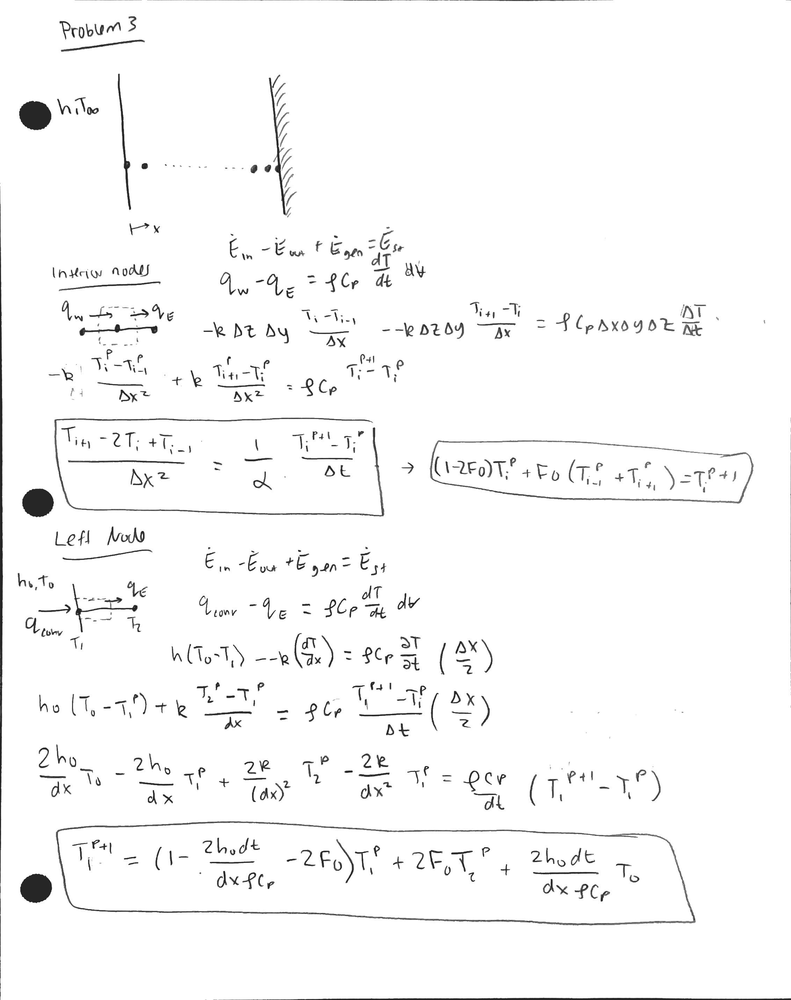

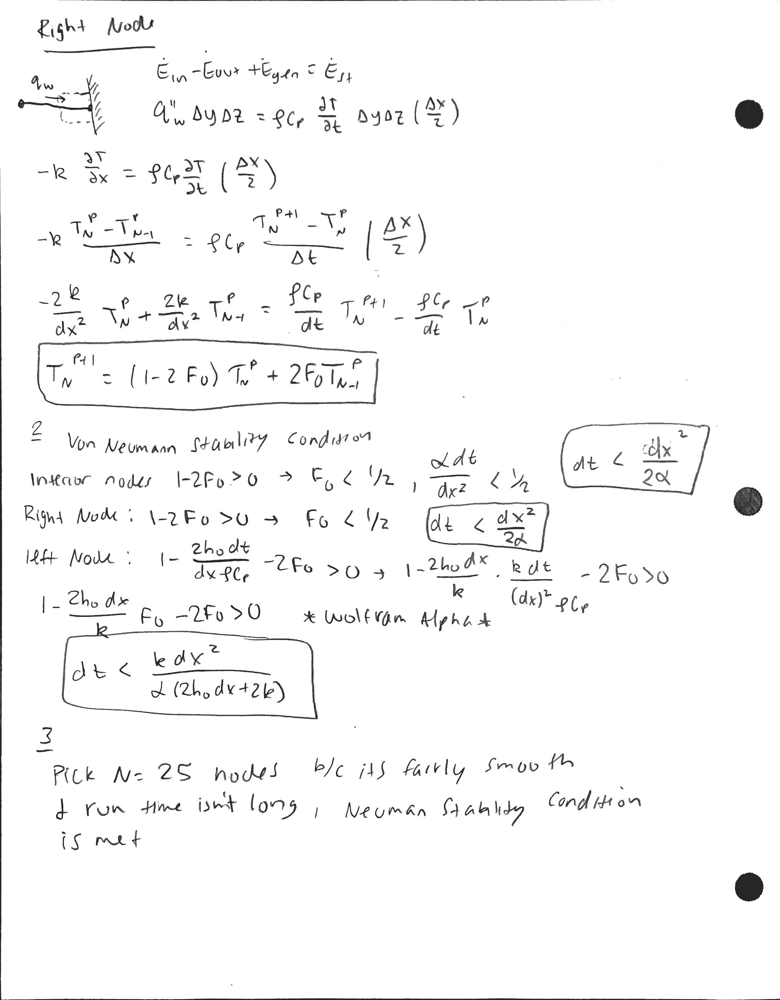

In [27]:
L=0.025
Ti=20+273.15
h0=1000
To=100+273.15
rho=2500
cp=1000
k=1
alpha=k/(rho*cp)
N=25
dx=L/(N-1)
dt_max=k*dx**2/(alpha*(2*h0*dx+2*k))
dt=dt_max/10
print('Neuman Stability', 'dt=' +str(dt)+'s','<',str(dt_max)+'s')
x=np.linspace(0,L,N)
tmax=4000
t=np.linspace(0,tmax, num=int(tmax/dt)+1)
Fo=alpha*dt/(dx**2)
T=np.zeros((size(x), size(t)))

T[:,0]=Ti
start=time.time()
for i1 in range(size(t)-1):
    for i2 in range(1,N-1):
        T[i2, i1+1]=(1-2*Fo)*T[i2,i1]+Fo*(T[i2-1,i1]+T[i2+1,i1])
        
    T[0,i1+1]=(1-(2*h0*dt)/(dx*rho*cp)-2*Fo)*T[0,i1]+2*Fo*T[1,i1]+(2*h0*dt)/(dx*rho*cp)*To
    
    T[N-1,i1+1]=(1-2*Fo)*T[N-1,i1]+2*Fo*T[N-2,i1]
end=time.time()
elapsed=end-start
print('Time elapsed', elapsed, 's for',str(N)+' nodes')

Neuman Stability dt=0.0664328231292517s < 0.664328231292517s
Time elapsed 2.0794436931610107 s for 25 nodes


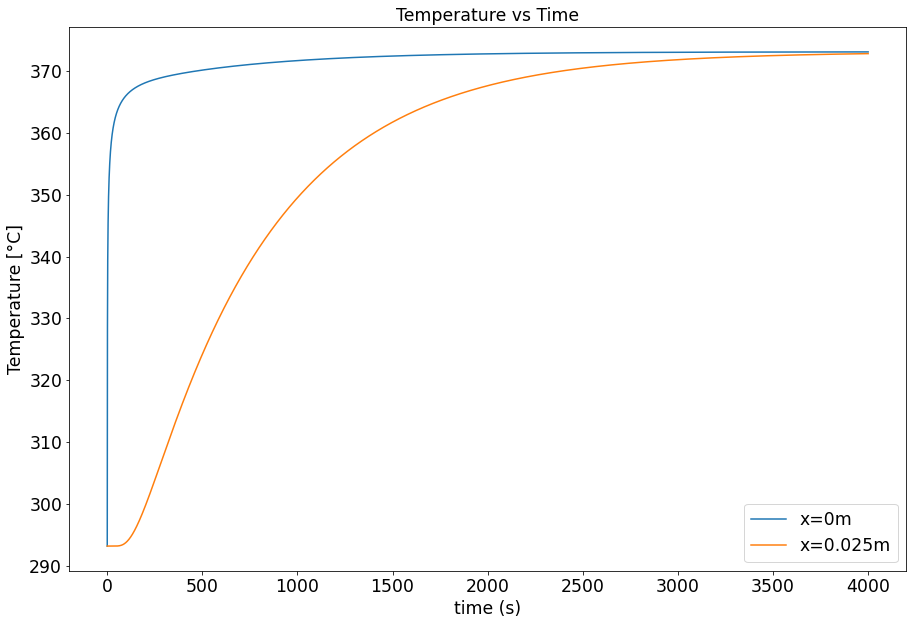

In [36]:
xp=[0,L]
label=str("x=" +str(xp[0])+'m')
plt.plot(t, T[0,:], label=label)
plt.xlabel('time (s)')
plt.ylabel('Temperature [°C]')
plt.title('Temperature vs Time')
label=str("x=" +str(xp[1])+'m')
plt.plot(t, T[-1,:], label=label)
plt.legend()
plt.show()

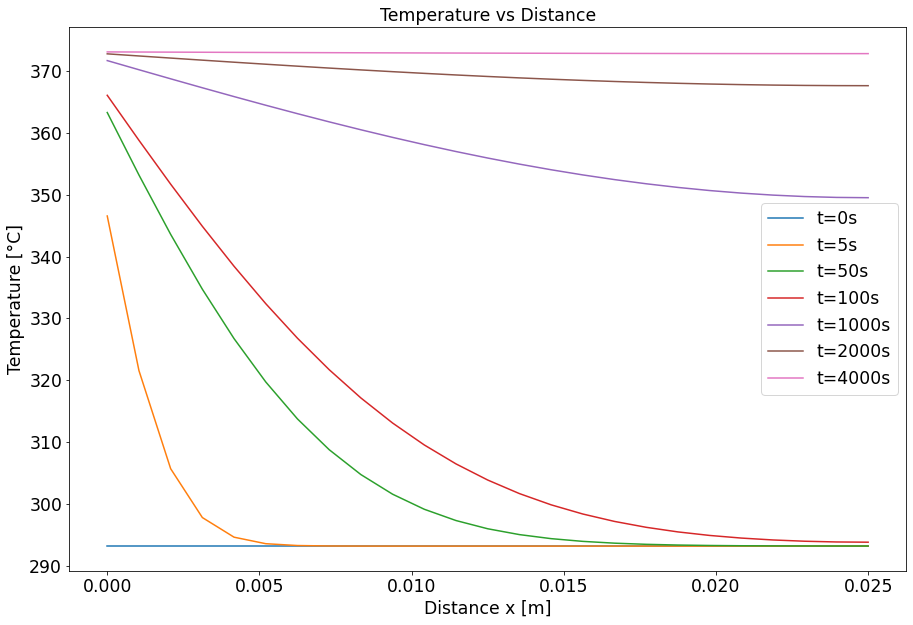

In [28]:
tp=[0,5,50,100,1000,2000,4000]
for t in tp:
    label=str("t=" +str(t)+'s')
    plt.plot(x, T[:, int(t/tmax*(int(tmax/dt)))], label=label)
    plt.xlabel('Distance x [m]')
    plt.ylabel('Temperature [°C]')
    plt.title('Temperature vs Distance')
plt.legend()
plt.show()

# Problem 4

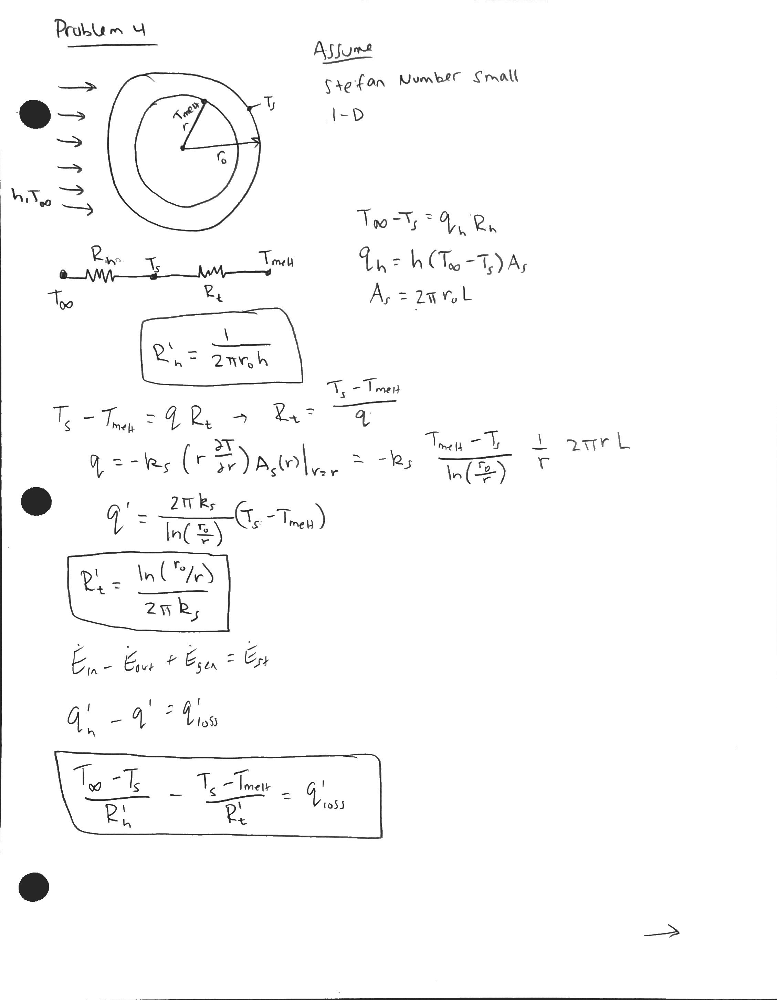

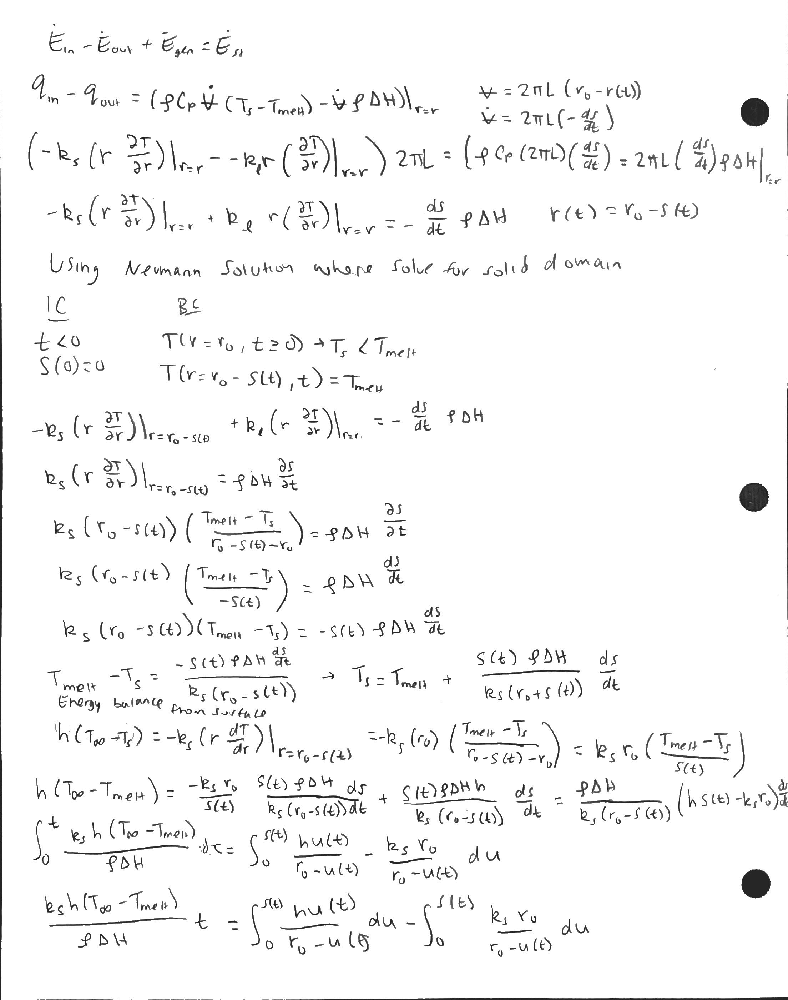

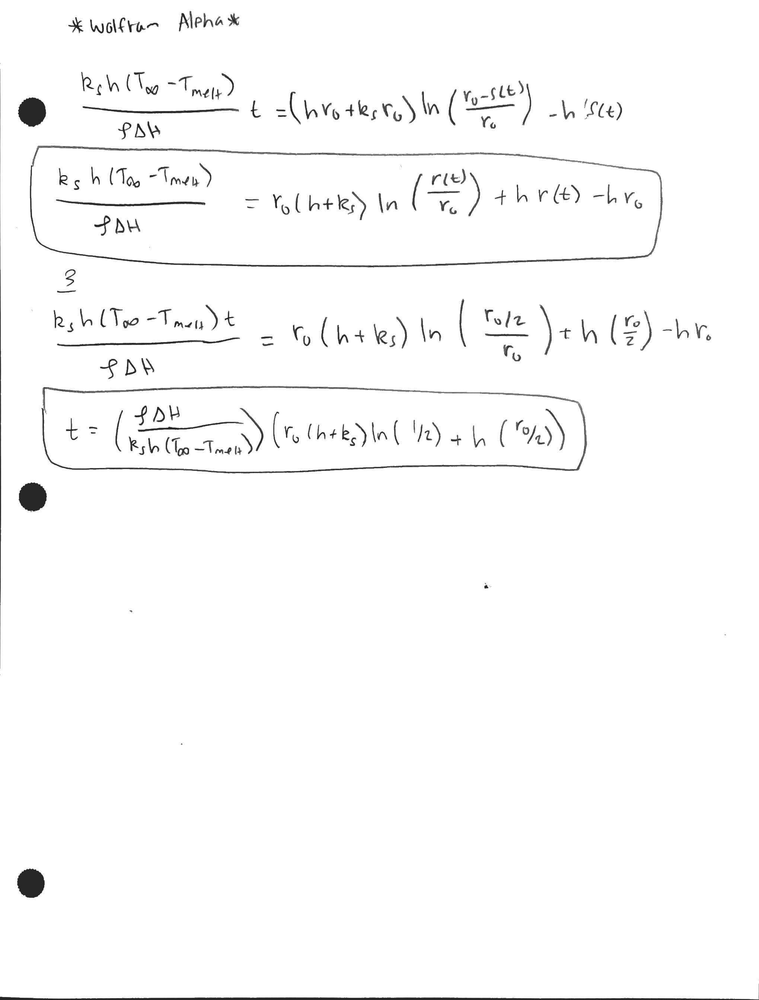

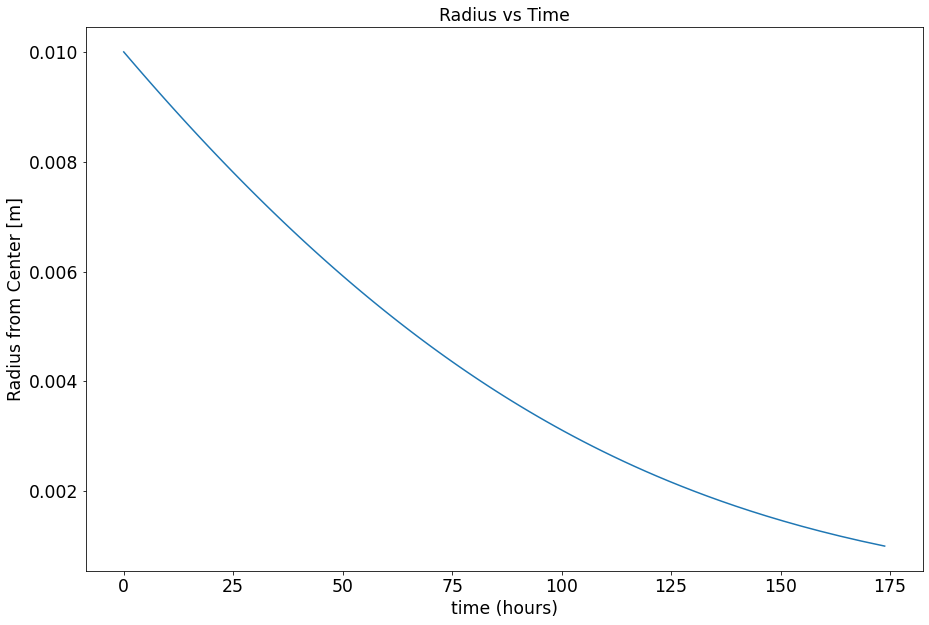

In [29]:
h=25
Tinf=-5+273.15
r0=0.01
Tmelt=0+273.15
rhos=520
ks=1.88
cps=2040
hsl=335*10**3
def t(r):
    return((rhos*hsl/(ks*h*(Tinf-Tmelt)))*(r0*(h+ks)*np.log(r/r0)+h*r-h*r0)/3600)
r=np.linspace(r0*0.1,r0,100)
time=t(r)
plt.plot(time, r)
plt.xlabel('time (hours)')
plt.ylabel('Radius from Center [m]')
plt.title('Radius vs Time')
plt.show()
